# Set up

In [1]:
from google.colab import drive

drive.mount('/content/drive')
drive_path = 'drive/MyDrive'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Unzipping the dataset without monochrome images
##### Link to the original dataset: https://universe.roboflow.com/myshroom-dataset-preprocessing/myshroomclassifier/dataset/1

In [2]:
!unzip -qq 'drive/MyDrive/MyShroomClassifierWithoutMonochromeImages.zip'

## The function that was used for detecting monochrome images

In [ ]:
from PIL import Image, ImageStat
from enum import Enum

class ImageType(Enum):
    MONOCHROME = 0
    COLOR = 1
    UNKNOWN = 2

# https://stackoverflow.com/questions/20068945/detect-if-image-is-color-grayscale-or-black-and-white-using-python
def detect_color_image(file, thumb_size = 40, MSE_cutoff = 22, adjust_color_bias = True, debug_info = False):
    pil_img = Image.open(file)
    bands = pil_img.getbands()
    if bands == ('R','G','B') or bands == ('R','G','B','A'):
        thumb = pil_img.resize((thumb_size, thumb_size))
        SSE, bias = 0, [0, 0, 0]
        if adjust_color_bias:
            bias = ImageStat.Stat(thumb).mean[:3]
            bias = [b - sum(bias)/3 for b in bias]
        for pixel in thumb.getdata():
            mu = sum(pixel)/3
            SSE += sum((pixel[i] - mu - bias[i])*(pixel[i] - mu - bias[i]) for i in [0, 1, 2])
        MSE = float(SSE)/(thumb_size * thumb_size)
        if debug_info:
            print(f'MSE = {MSE}')
        if MSE <= MSE_cutoff:
            return(ImageType.MONOCHROME)
        else:
            return(ImageType.COLOR)
    elif len(bands) == 1:
        return(ImageType.MONOCHROME)
    else:
        return(ImageType.UNKNOWN)

## Libraries

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout, Conv2D, BatchNormalization, ReLU
from keras.layers import MaxPooling2D, AveragePooling2D, GlobalMaxPooling2D, GlobalAveragePooling2D
#Image preprocessing
from keras.layers import Rescaling, Resizing
#Image augmentation
from keras.layers import RandomFlip, RandomRotation, RandomZoom

tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# Creating NumPy datasets

In [3]:
'''
labels = [
    'Agaricus',
    'Amanita',
    'Boletus',
    'Cortinarius',
    'Entoloma',
    'Hygrocybe',
    'Lactarius',
    'Russula',
    'Suillus']
'''

labels = [
    'Amanita',
    'Lactarius',
    'Cortinarius',
    'Boletus',
    'Entoloma',
    'Russula',
    'Hygrocybe',
    'Agaricus',
    'Suillus']

In [5]:
import os

def make_numpy_dataset(dataset_path, labels):
    x = []
    y = []
    for i, label in enumerate(labels):
        images_folder = dataset_path + '/' + label
        for image_path in os.listdir(images_folder):
            image = plt.imread(images_folder + '/' + image_path)
            x.append(image)
            y.append(label)
    return np.array(x), np.array(y)

In [6]:
x, y = make_numpy_dataset('MyShroomClassifierWithoutMonochromeImages', labels)
np.save(f'{drive_path}/myshroom_x.npy', x)
np.save(f'{drive_path}/myshroom_y.npy', y)
print('Done!')

Done!


In [7]:
print(x.shape)
print(y.shape)

(10204, 224, 224, 3)
(10204,)


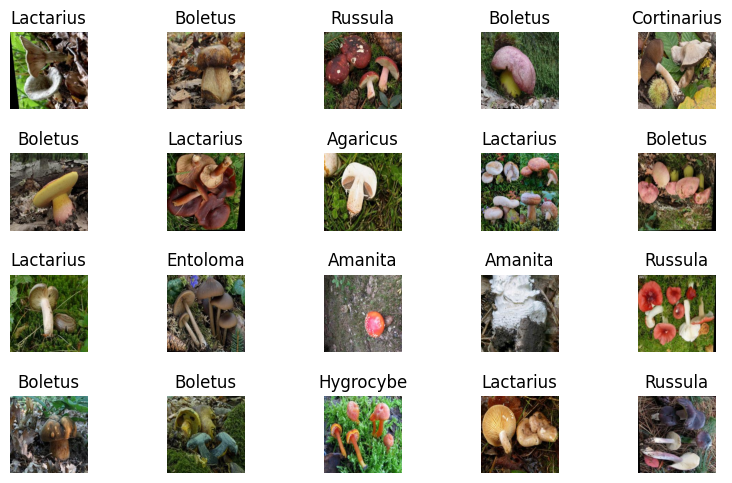

In [8]:
plt.subplots(4, 5, figsize = (8, 5))
plt.tight_layout()
for i in range(0, 20):
    n = np.random.randint(0, x.shape[0])
    plt.subplot(4, 5, i + 1)
    plt.axis('off')
    plt.gca().set_title(y[n])
    plt.imshow(x[n])
plt.show()

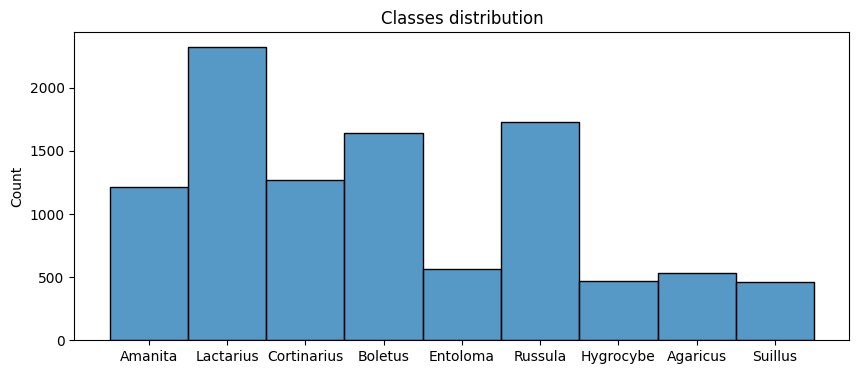

In [9]:
plt.figure(figsize = (10, 4))
plt.title('Classes distribution')
sb.histplot(y, discrete = True)
plt.show()

# Creating balanced and resized dataset (128x128) using augmentation

In [10]:
classes = np.unique(y, return_counts = True)
classes_dict = dict(zip(classes[0], classes[1]))
sorted_classes_dict = {k : classes_dict[k] for k in labels}
sorted_classes_dict

{'Amanita': 1210,
 'Lactarius': 2323,
 'Cortinarius': 1271,
 'Boletus': 1640,
 'Entoloma': 566,
 'Russula': 1730,
 'Hygrocybe': 469,
 'Agaricus': 533,
 'Suillus': 462}

In [11]:
max_class = max(sorted_classes_dict.items(), key = lambda k: k[1])
max_class

('Lactarius', 2323)

In [12]:
new_width = 128
new_height = 128

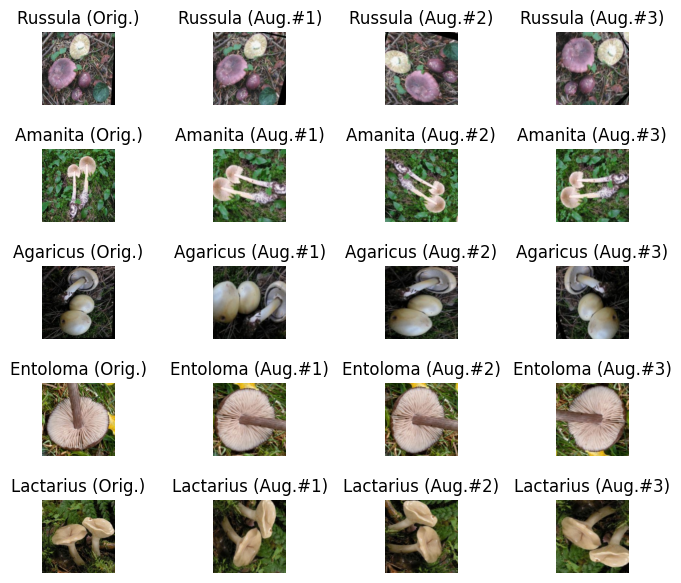

In [25]:
augmentation = Sequential([
    RandomFlip('horizontal_and_vertical'),
    RandomRotation(0.8),
    RandomZoom(height_factor = (0.0, -0.3), width_factor = (0.0, -0.3)),
    Resizing(new_width, new_height)
])

num_subplot = 0
plt.subplots(5, 4, figsize = (7, 6))
plt.tight_layout()
for i in range(0, 5):
    n = np.random.randint(0, x.shape[0])
    num_subplot += 1
    plt.subplot(5, 4, num_subplot)
    plt.axis('off')
    plt.gca().set_title(f'{y[n]} (Orig.)')
    plt.imshow(x[n])
    for j in range(0, 3):
        num_subplot += 1
        plt.subplot(5, 4, num_subplot)
        plt.axis('off')
        plt.gca().set_title(f'{y[n]} (Aug.#{j + 1})')
        image = augmentation(x[n], training = True).numpy().astype('uint8')
        plt.imshow(image)
plt.show()

In [26]:
augmentation_count = max_class[1] + 200
augmented_images_from_classes = {}
offset = -1

for label in list(sorted_classes_dict.keys()):
    augmented_images_from_classes[label] = []
    current_class_count = sorted_classes_dict[label]
    images = x[(offset + 1):(offset + 1 + current_class_count)]
    for i in range(0, augmentation_count - current_class_count):
        augmented_image = augmentation(images[i % current_class_count], training = True).numpy().astype('uint8')
        augmented_images_from_classes[label].append(augmented_image)
    offset += current_class_count

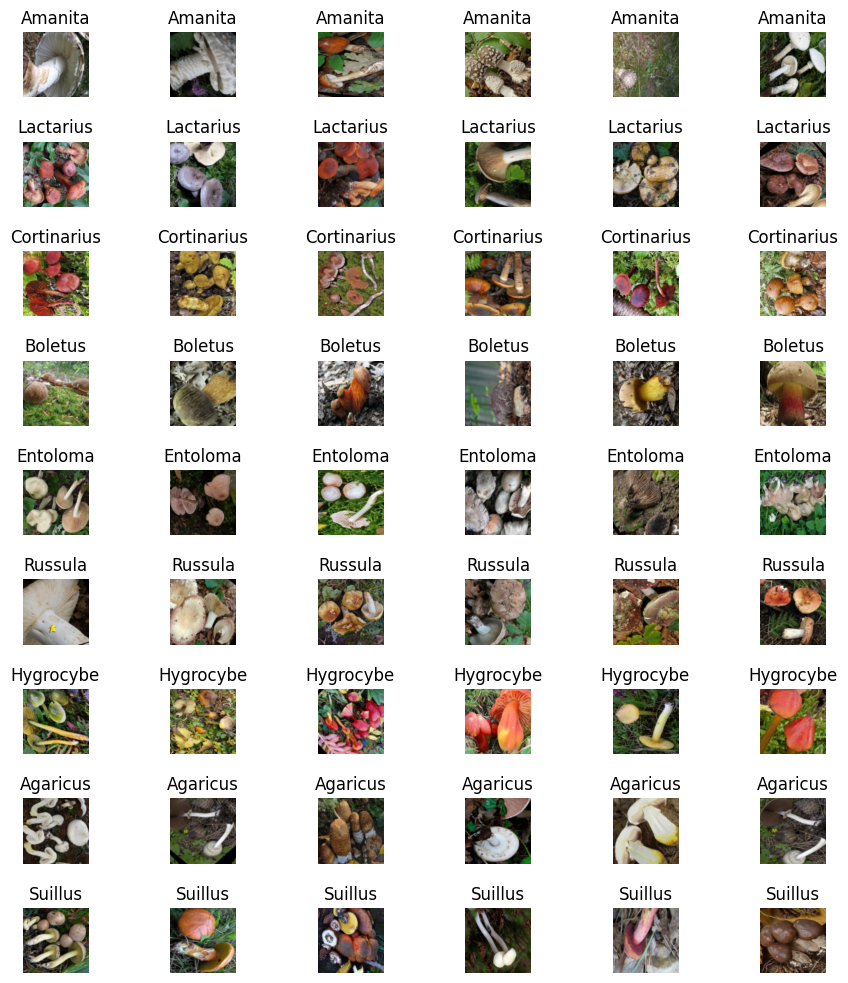

In [27]:
num_subplot = 0
plt.subplots(9, 6, figsize = (9, 10))
plt.tight_layout()
for label in augmented_images_from_classes:
    for i in range (0, 6):
        num_subplot += 1
        plt.subplot(9, 6, num_subplot)
        plt.axis('off')
        plt.gca().set_title(f'{label}')
        plt.imshow(augmented_images_from_classes[label][i])
plt.show()

In [28]:
for label in augmented_images_from_classes:
    augmented_images_from_classes[label] = np.array(augmented_images_from_classes[label])
    print(augmented_images_from_classes[label].shape)

(1313, 128, 128, 3)
(200, 128, 128, 3)
(1252, 128, 128, 3)
(883, 128, 128, 3)
(1957, 128, 128, 3)
(793, 128, 128, 3)
(2054, 128, 128, 3)
(1990, 128, 128, 3)
(2061, 128, 128, 3)


In [29]:
resize = Sequential([
    Resizing(new_width, new_height)
])

x_resized = []
for sample in x:
    resized_image = resize(sample, training = True).numpy().astype('uint8')
    x_resized.append(resized_image)
x_resized = np.array(x_resized)
x_resized.shape

(10204, 128, 128, 3)

In [30]:
augmented_x = np.concatenate((
    x_resized,
    augmented_images_from_classes['Amanita'],
    augmented_images_from_classes['Lactarius'],
    augmented_images_from_classes['Cortinarius'],
    augmented_images_from_classes['Boletus'],
    augmented_images_from_classes['Entoloma'],
    augmented_images_from_classes['Russula'],
    augmented_images_from_classes['Hygrocybe'],
    augmented_images_from_classes['Agaricus'],
    augmented_images_from_classes['Suillus']
))

augmented_y = np.concatenate((
    y,
    np.array(['Amanita'] * augmented_images_from_classes['Amanita'].shape[0]),
    np.array(['Lactarius'] * augmented_images_from_classes['Lactarius'].shape[0]),
    np.array(['Cortinarius'] * augmented_images_from_classes['Cortinarius'].shape[0]),
    np.array(['Boletus'] * augmented_images_from_classes['Boletus'].shape[0]),
    np.array(['Entoloma'] * augmented_images_from_classes['Entoloma'].shape[0]),
    np.array(['Russula'] * augmented_images_from_classes['Russula'].shape[0]),
    np.array(['Hygrocybe'] * augmented_images_from_classes['Hygrocybe'].shape[0]),
    np.array(['Agaricus'] * augmented_images_from_classes['Agaricus'].shape[0]),
    np.array(['Suillus'] * augmented_images_from_classes['Suillus'].shape[0])
))

print(augmented_x.shape)
print(augmented_y.shape)

(22707, 128, 128, 3)
(22707,)


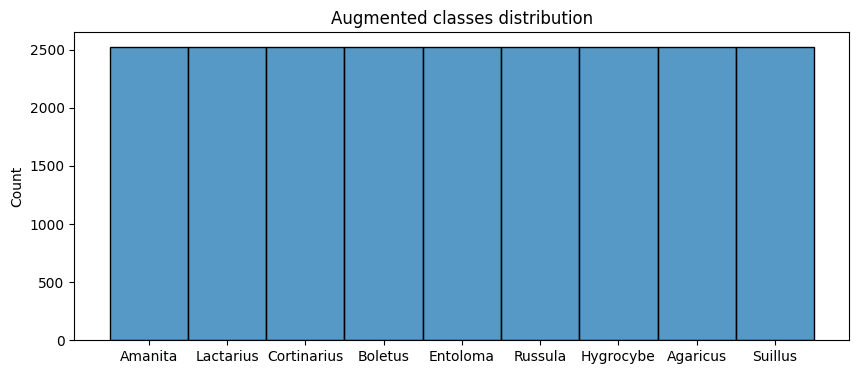

In [31]:
plt.figure(figsize = (10, 4))
plt.title('Augmented classes distribution')
sb.histplot(augmented_y, discrete = True)
plt.show()

In [32]:
np.save(f'{drive_path}/myshroom_x_augmented.npy', augmented_x)
np.save(f'{drive_path}/myshroom_y_augmented.npy', augmented_y)
print('Done!')

Done!


# Preprocessing

In [33]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
encoded_y = encoder.fit_transform(augmented_y)
print(encoder.inverse_transform([0]))
print(encoder.classes_)

['Agaricus']
['Agaricus' 'Amanita' 'Boletus' 'Cortinarius' 'Entoloma' 'Hygrocybe'
 'Lactarius' 'Russula' 'Suillus']


In [34]:
encoded_y

array([1, 1, 1, ..., 8, 8, 8])

# Data split

## Using train_test_split function...

In [35]:
x_train_, x_test, y_train_, y_test = train_test_split(augmented_x, encoded_y, test_size = 0.25, random_state = 42, shuffle = True)
x_train, x_validation, y_train, y_validation = train_test_split(x_train_, y_train_, test_size = 0.1, random_state = 42)

print(f'x train: {x_train.shape}')
print(f'y train: {y_train.shape}')
print()
print(f'x test: {x_test.shape}')
print(f'y test: {y_test.shape}')
print()
print(f'x validation: {x_validation.shape}')
print(f'y validation: {y_validation.shape}')

x train: (15327, 128, 128, 3)
y train: (15327,)

x test: (5677, 128, 128, 3)
y test: (5677,)

x validation: (1703, 128, 128, 3)
y validation: (1703,)


In [36]:
np.save(f'{drive_path}/myshroom_x_augmented_train.npy', x_train)
np.save(f'{drive_path}/myshroom_x_augmented_test.npy', x_test)
np.save(f'{drive_path}/myshroom_x_augmented_validation.npy', x_validation)
np.save(f'{drive_path}/myshroom_y_augmented_train.npy', y_train)
np.save(f'{drive_path}/myshroom_y_augmented_test.npy', y_test)
np.save(f'{drive_path}/myshroom_y_augmented_validation.npy', y_validation)
print('Done!')

Done!


## ...Or loading necessary datasets from files

In [4]:
x_train = np.load(f'{drive_path}/myshroom_x_augmented_train.npy')
x_test = np.load(f'{drive_path}/myshroom_x_augmented_test.npy')
x_validation = np.load(f'{drive_path}/myshroom_x_augmented_validation.npy')
y_train = np.load(f'{drive_path}/myshroom_y_augmented_train.npy')
y_test = np.load(f'{drive_path}/myshroom_y_augmented_test.npy')
y_validation = np.load(f'{drive_path}/myshroom_y_augmented_validation.npy')

print(f'x train: {x_train.shape}')
print(f'y train: {y_train.shape}')
print()
print(f'x test: {x_test.shape}')
print(f'y test: {y_test.shape}')
print()
print(f'x validation: {x_validation.shape}')
print(f'y validation: {y_validation.shape}')

x train: (15327, 128, 128, 3)
y train: (15327,)

x test: (5677, 128, 128, 3)
y test: (5677,)

x validation: (1703, 128, 128, 3)
y validation: (1703,)


# Encoder for dataset from files

In [5]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
encoder.fit(labels)
print(encoder.inverse_transform([0]))
print(encoder.classes_)

['Agaricus']
['Agaricus' 'Amanita' 'Boletus' 'Cortinarius' 'Entoloma' 'Hygrocybe'
 'Lactarius' 'Russula' 'Suillus']


# Neural networks for image classification

In [6]:
def show_confusion_matrix(labels_test, labels_predicted, labels = None):
    plt.figure(figsize = (10, 7))
    cm = confusion_matrix(labels_test, labels_predicted)
    if labels != None:
        sb.heatmap(
            cm,
            annot = True,
            fmt = 'd',
            cbar = False,
            xticklabels = labels,
            yticklabels = labels)
    else:
        sb.heatmap(
            cm,
            annot = True,
            fmt = 'd',
            cbar = False)
    plt.xlabel('Predicted')
    plt.ylabel('Truth')
    plt.show()

def show_training_history(history, last_epoch = None):
    fig, ax = plt.subplots(2, 1)
    ax[0].plot(history.history['loss'], color = 'b', label = 'Training loss')
    if 'val_loss' in history.history:
        ax[0].plot(history.history['val_loss'], color = 'r', label = 'Validation loss', axes = ax[0])
    if last_epoch is not None:
        ax[0].axvline(x = last_epoch, color = 'g', label = 'Start of fine tuning')
    legend = ax[0].legend(loc = 'best', shadow = True)
    ax[1].plot(history.history['accuracy'], color = 'b', label = 'Training accuracy')
    if 'val_accuracy' in history.history:
        ax[1].plot(history.history['val_accuracy'], color = 'r',label = 'Validation accuracy')
    if last_epoch is not None:
        ax[1].axvline(x = last_epoch, color = 'g', label = 'Start of fine tuning')
    legend = ax[1].legend(loc = 'best', shadow = True)
    plt.show()

In [7]:
img_width = x_train.shape[1]
img_height = x_train.shape[2]
channels = x_train.shape[3]
num_classes = len(encoder.classes_)

print(f'Width: {img_width}')
print(f'Height: {img_height}')
print(f'Channels: {channels}')
print(f'Number of classes: {num_classes}')

Width: 128
Height: 128
Channels: 3
Number of classes: 9


## CNN

In [8]:
cnn = Sequential([
    # preprocessing
    #Rescaling(scale = 1.0/255.0, input_shape = (img_width, img_height, channels)),
    Rescaling(scale = 1.0/127.5, offset = -1, input_shape = (img_width, img_height, channels)),

    # augmentation
    RandomFlip('horizontal_and_vertical'),
    RandomRotation(0.8),
    RandomZoom(height_factor = (0.0, -0.3), width_factor = (0.0, -0.3)),

    # convolution
    Conv2D(8, (3, 3), input_shape = (img_width, img_height, channels)),
    Conv2D(8, (3, 3)),
    BatchNormalization(),
    ReLU(),
    MaxPooling2D(pool_size = (2, 2)),

    Conv2D(16, (3, 3)),
    Conv2D(16, (3, 3)),
    BatchNormalization(),
    ReLU(),
    MaxPooling2D(pool_size = (2, 2)),

    Conv2D(32, (3, 3)),
    Conv2D(32, (3, 3)),
    BatchNormalization(),
    ReLU(),
    MaxPooling2D(pool_size = (2, 2)),

    Conv2D(64, (3, 3)),
    Conv2D(64, (3, 3)),
    BatchNormalization(),
    ReLU(),
    MaxPooling2D(pool_size = (2, 2)),

    Flatten(),
    Dense(512, activation = 'relu'),
    Dropout(0.25),
    Dense(256, activation = 'relu'),
    Dense(num_classes, activation = 'softmax')
])

cnn.compile(loss = 'sparse_categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
input_shape = x_train.shape
cnn.build(input_shape = input_shape)
print(cnn.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 128, 128, 3)       0         
                                                                 
 random_flip (RandomFlip)    (None, 128, 128, 3)       0         
                                                                 
 random_rotation (RandomRota  (None, 128, 128, 3)      0         
 tion)                                                           
                                                                 
 random_zoom (RandomZoom)    (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 126, 126, 8)       224       
                                                                 
 conv2d_1 (Conv2D)           (None, 124, 124, 8)       584       
                                                        

In [9]:
epochs = 200
batch_size = 32
cnn_history = cnn.fit(
    x = x_train,
    y = y_train,
    validation_data = (x_validation, y_validation),
    batch_size = batch_size,
    epochs = epochs)

loss, accuracy = cnn.evaluate(x_test, y_test)

print('---------')
print(f'Accuracy: {accuracy}, loss: {loss}')
print('---------')

Epoch 1/200
479/479 [==============================] - 31s 21ms/step - loss: 2.0565 - accuracy: 0.2332 - val_loss: 2.0635 - val_accuracy: 0.2413
Epoch 2/200
479/479 [==============================] - 8s 17ms/step - loss: 1.9181 - accuracy: 0.2896 - val_loss: 2.1947 - val_accuracy: 0.1861
Epoch 3/200
479/479 [==============================] - 9s 19ms/step - loss: 1.8522 - accuracy: 0.3177 - val_loss: 1.7895 - val_accuracy: 0.3406
Epoch 4/200
479/479 [==============================] - 11s 23ms/step - loss: 1.8016 - accuracy: 0.3425 - val_loss: 1.7935 - val_accuracy: 0.3570
Epoch 5/200
479/479 [==============================] - 9s 18ms/step - loss: 1.7559 - accuracy: 0.3596 - val_loss: 1.7405 - val_accuracy: 0.3558
Epoch 6/200
479/479 [==============================] - 9s 19ms/step - loss: 1.7189 - accuracy: 0.3714 - val_loss: 1.9137 - val_accuracy: 0.3218
Epoch 7/200
479/479 [==============================] - 9s 18ms/step - loss: 1.6847 - accuracy: 0.3903 - val_loss: 1.6802 - val_accurac

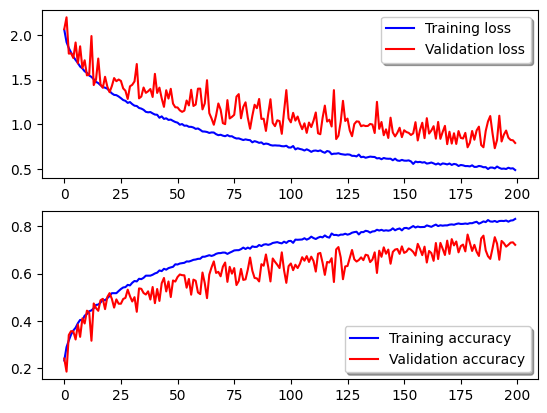

178/178 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

    Agaricus       0.92      0.78      0.84       610
     Amanita       0.60      0.76      0.67       610
     Boletus       0.81      0.75      0.78       632
 Cortinarius       0.67      0.62      0.65       644
    Entoloma       0.92      0.73      0.82       650
   Hygrocybe       0.96      0.88      0.92       649
   Lactarius       0.49      0.73      0.58       644
     Russula       0.63      0.65      0.64       625
     Suillus       0.91      0.75      0.82       613

    accuracy                           0.74      5677
   macro avg       0.77      0.74      0.75      5677
weighted avg       0.77      0.74      0.75      5677



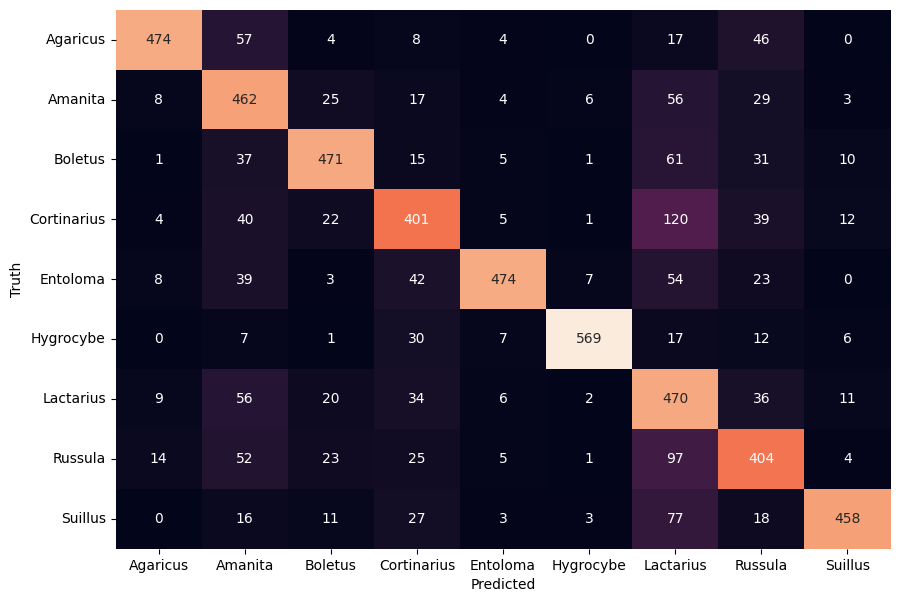

In [23]:
show_training_history(cnn_history)
y_predicted_from_cnn = np.argmax(cnn.predict(x_test), axis = 1)
print(classification_report(
    encoder.inverse_transform(y_test),
    encoder.inverse_transform(y_predicted_from_cnn)))
show_confusion_matrix(y_test, y_predicted_from_cnn, list(encoder.classes_))

In [11]:
cnn.save(f'{drive_path}/myshroom_128x128_cnn_v5.keras')

## Transfer learning (VGG19)

In [12]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras import Input, Model

base_model = VGG19(weights = 'imagenet', include_top = False, input_shape = (img_width, img_height, channels))
for layer in base_model.layers:
    layer.trainable = False

data_augmentation = tf.keras.Sequential([
    RandomFlip('horizontal_and_vertical'),
    RandomRotation(0.8),
    RandomZoom(height_factor = (0.0, -0.3), width_factor = (0.0, -0.3))
])

inputs = Input(shape = (img_width, img_height, channels))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training = False)
x = GlobalMaxPooling2D()(x)
x = Dense(512, activation = 'relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(128, activation = 'relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
outputs = Dense(num_classes, activation = 'softmax')(x)
model_vgg19 = Model(inputs, outputs)

model_vgg19.compile(loss = 'sparse_categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
input_shape = x_train.shape
model_vgg19.build(input_shape = input_shape)
print(model_vgg19.summary())

80134624/80134624 [==============================] - 5s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, 128, 128, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 128, 128, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 128, 128, 3)      0         
                                                                 
 vgg19 (Functional)          (None, 4, 4, 512)         20024384  
                                                                 
 global_max_pooling2d (Globa  (None, 512)              0      

In [13]:
epochs = 60
batch_size = 32
model_vgg19_history = model_vgg19.fit(
    x = x_train,
    y = y_train,
    validation_data = (x_validation, y_validation),
    batch_size = batch_size,
    epochs = epochs)

loss, accuracy = model_vgg19.evaluate(x_test, y_test)

print('---------')
print(f'Accuracy: {accuracy}, loss: {loss}')
print('---------')

Epoch 1/60
479/479 [==============================] - 43s 77ms/step - loss: 1.9140 - accuracy: 0.3877 - val_loss: 1.3723 - val_accuracy: 0.5408
Epoch 2/60
479/479 [==============================] - 32s 68ms/step - loss: 1.4502 - accuracy: 0.4914 - val_loss: 1.2585 - val_accuracy: 0.5796
Epoch 3/60
479/479 [==============================] - 33s 69ms/step - loss: 1.3336 - accuracy: 0.5296 - val_loss: 1.2449 - val_accuracy: 0.5708
Epoch 4/60
479/479 [==============================] - 33s 70ms/step - loss: 1.2882 - accuracy: 0.5471 - val_loss: 1.1909 - val_accuracy: 0.5931
Epoch 5/60
479/479 [==============================] - 33s 69ms/step - loss: 1.2657 - accuracy: 0.5602 - val_loss: 1.1917 - val_accuracy: 0.5948
Epoch 6/60
479/479 [==============================] - 33s 69ms/step - loss: 1.2436 - accuracy: 0.5662 - val_loss: 1.2495 - val_accuracy: 0.5784
Epoch 7/60
479/479 [==============================] - 33s 69ms/step - loss: 1.2205 - accuracy: 0.5746 - val_loss: 1.2117 - val_accuracy:

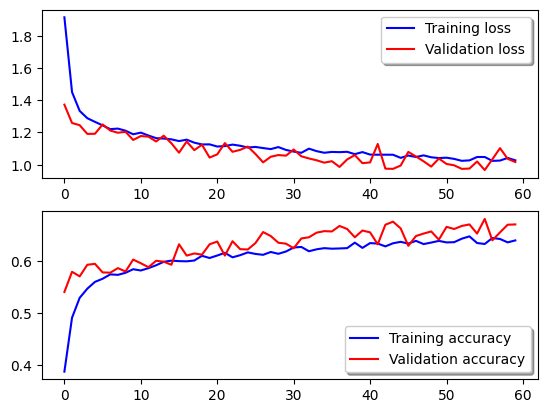

178/178 [==============================] - 10s 56ms/step
              precision    recall  f1-score   support

    Agaricus       0.76      0.65      0.70       610
     Amanita       0.73      0.65      0.69       610
     Boletus       0.72      0.87      0.79       632
 Cortinarius       0.58      0.41      0.48       644
    Entoloma       0.84      0.64      0.73       650
   Hygrocybe       0.93      0.84      0.88       649
   Lactarius       0.43      0.71      0.53       644
     Russula       0.51      0.70      0.59       625
     Suillus       0.84      0.51      0.64       613

    accuracy                           0.67      5677
   macro avg       0.70      0.67      0.67      5677
weighted avg       0.70      0.67      0.67      5677



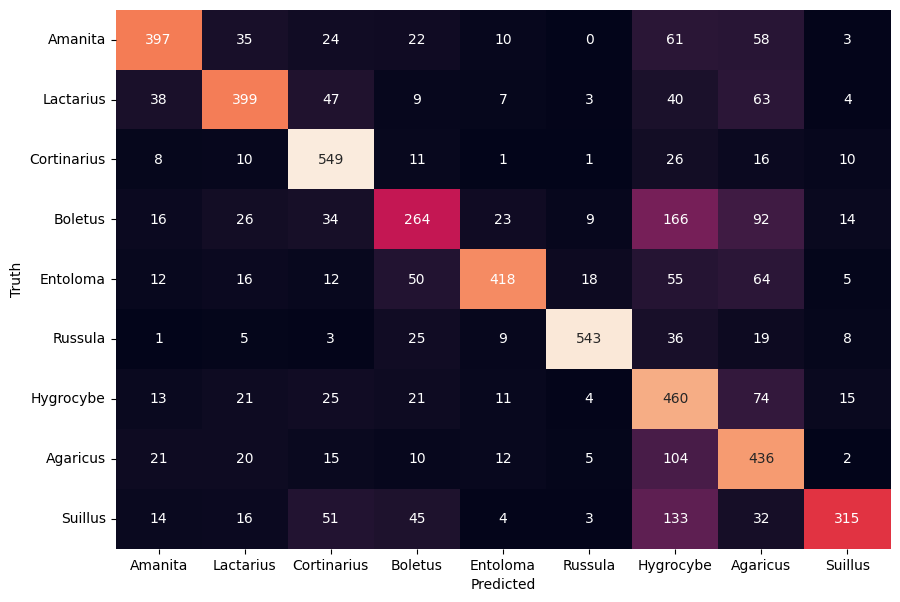

In [14]:
show_training_history(model_vgg19_history)
y_predicted_from_cnn = np.argmax(model_vgg19.predict(x_test), axis = 1)
print(classification_report(
    encoder.inverse_transform(y_test),
    encoder.inverse_transform(y_predicted_from_cnn)))

In [15]:
from tensorflow.keras.optimizers import Adam

for layer in base_model.layers:
    layer.trainable = True

model_vgg19.compile(
    loss = 'sparse_categorical_crossentropy',
    optimizer = Adam(1e-5),
    metrics = ['accuracy'])

In [16]:
epochs += 20
last_epoch = model_vgg19_history.epoch[-1]
batch_size = 32
model_vgg19_history_fine_tune = model_vgg19.fit(
    x = x_train,
    y = y_train,
    validation_data = (x_validation, y_validation),
    batch_size = batch_size,
    epochs = epochs,
    initial_epoch = last_epoch)

loss, accuracy = model_vgg19.evaluate(x_test, y_test)

print('---------')
print(f'Accuracy: {accuracy}, loss: {loss}')
print('---------')

Epoch 60/80
479/479 [==============================] - 104s 192ms/step - loss: 0.9895 - accuracy: 0.6591 - val_loss: 0.8963 - val_accuracy: 0.6870
Epoch 61/80
479/479 [==============================] - 90s 188ms/step - loss: 0.8584 - accuracy: 0.7080 - val_loss: 0.8198 - val_accuracy: 0.7305
Epoch 62/80
479/479 [==============================] - 88s 183ms/step - loss: 0.7750 - accuracy: 0.7397 - val_loss: 0.9051 - val_accuracy: 0.6905
Epoch 63/80
479/479 [==============================] - 88s 183ms/step - loss: 0.7532 - accuracy: 0.7456 - val_loss: 0.7607 - val_accuracy: 0.7399
Epoch 64/80
479/479 [==============================] - 88s 184ms/step - loss: 0.7104 - accuracy: 0.7628 - val_loss: 0.8138 - val_accuracy: 0.7287
Epoch 65/80
479/479 [==============================] - 90s 188ms/step - loss: 0.7200 - accuracy: 0.7603 - val_loss: 0.6301 - val_accuracy: 0.7992
Epoch 66/80
479/479 [==============================] - 90s 188ms/step - loss: 0.6584 - accuracy: 0.7810 - val_loss: 0.7376 

In [17]:
model_vgg19_history.history['accuracy'] += model_vgg19_history_fine_tune.history['accuracy']
model_vgg19_history.history['val_accuracy'] += model_vgg19_history_fine_tune.history['val_accuracy']
model_vgg19_history.history['loss'] += model_vgg19_history_fine_tune.history['loss']
model_vgg19_history.history['val_loss'] += model_vgg19_history_fine_tune.history['val_loss']

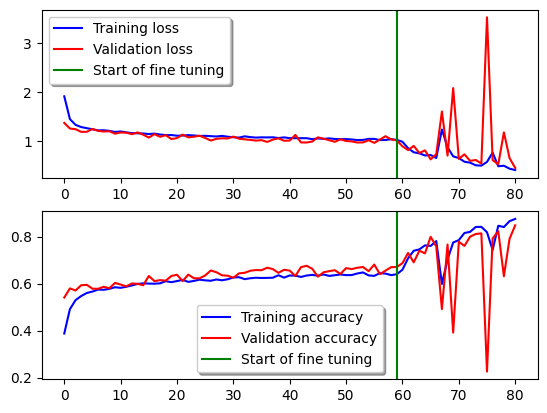

178/178 [==============================] - 10s 57ms/step
              precision    recall  f1-score   support

    Agaricus       0.90      0.90      0.90       610
     Amanita       0.89      0.83      0.86       610
     Boletus       0.82      0.96      0.88       632
 Cortinarius       0.85      0.76      0.80       644
    Entoloma       0.94      0.86      0.90       650
   Hygrocybe       0.98      0.95      0.96       649
   Lactarius       0.66      0.85      0.74       644
     Russula       0.84      0.79      0.82       625
     Suillus       0.94      0.84      0.89       613

    accuracy                           0.86      5677
   macro avg       0.87      0.86      0.86      5677
weighted avg       0.87      0.86      0.86      5677



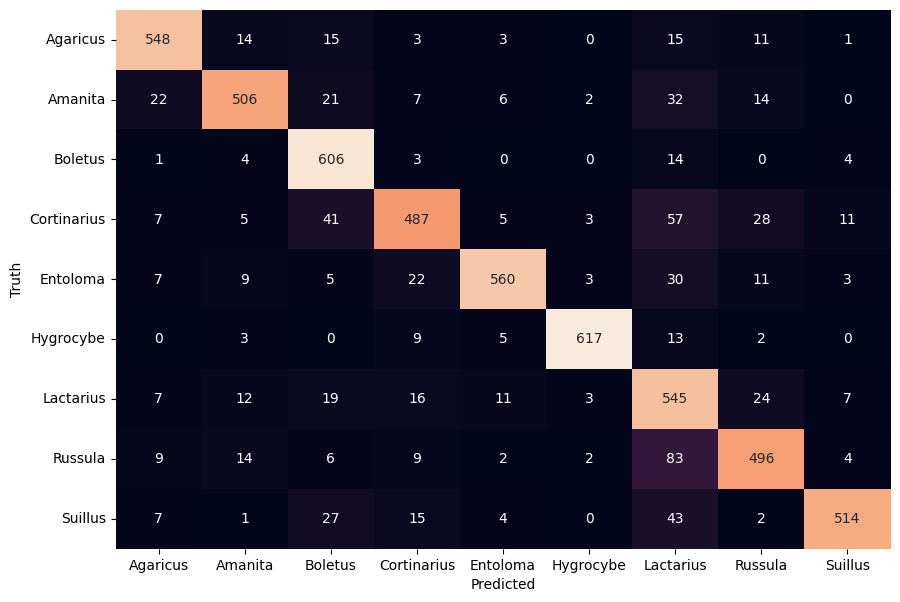

In [24]:
show_training_history(model_vgg19_history, last_epoch)
y_predicted_from_cnn = np.argmax(model_vgg19.predict(x_test), axis = 1)
print(classification_report(
    encoder.inverse_transform(y_test),
    encoder.inverse_transform(y_predicted_from_cnn)))
show_confusion_matrix(y_test, y_predicted_from_cnn, list(encoder.classes_))

In [19]:
model_vgg19.save(f'{drive_path}/myshroom_128x128_transfer_vgg19_v5.keras')

# Model testing

In [27]:
from PIL import Image
import os

def test_model(model, label_encoder, image_path, image_width, image_height, num_channels):
    test_image = Image.open(image_path)
    test_image_resized = test_image.resize((image_width, image_height))
    test_image_reshaped = np.reshape(np.asarray(test_image_resized), (1, image_width, image_height, num_channels))
    inference = model(test_image_reshaped, training = False).numpy()
    predicted_value = np.argmax(inference, axis = -1)
    predicted_label = label_encoder.inverse_transform(predicted_value)[0]
    probability = inference[0][predicted_value][0]
    return test_image_resized, predicted_value, predicted_label, inference, probability

def test_model_on_image(model, label_encoder, image_path, image_width, image_height, num_channels):
    image, predicted_value, predicted_label, _, probability = test_model(
        model,
        label_encoder,
        image_path,
        image_width,
        image_height,
        num_channels)
    plt.figure(figsize = (2, 2))
    plt.axis('off')
    plt.gca().set_title(f'{predicted_label} ({probability * 100:.2f}%)')
    plt.imshow(image)
    plt.show()

def test_model_on_dataset(model, label_encoder, dataset_path, labels, image_width, image_height, num_channels):
    y_true = []
    y_pred = []
    for label in labels:
        folder = dataset_path + '/' + label
        for folder_file in os.listdir(folder):
            image_path = folder + '/' + folder_file
            try:
                image, predicted_value, predicted_label, _, probability = test_model(
                    model,
                    label_encoder,
                    image_path,
                    image_width,
                    image_height,
                    num_channels)
                y_true.append(label_encoder.transform([label]))
                y_pred.append(predicted_value)
                plt.figure(figsize = (2, 2))
                plt.axis('off')
                label_name = predicted_label if (predicted_label == label) else f'{predicted_label} [X] - {label}'
                plt.gca().set_title(f'{label_name} ({probability * 100:.2f}%)')
                plt.imshow(image)
                plt.show()
            except Exception as ex:
                print(f'Prediction failed on image "{image_path}": {ex}')
    return y_true, y_pred

In [26]:
!unzip -qq 'drive/MyDrive/MushroomsFromInternet.zip'

!wget https://grib-apteka.ru/gallery/max/photo10.jpg

--2023-09-06 13:06:46--  https://grib-apteka.ru/gallery/max/photo10.jpg
Resolving grib-apteka.ru (grib-apteka.ru)... 45.130.41.97
Connecting to grib-apteka.ru (grib-apteka.ru)|45.130.41.97|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 177629 (173K) [image/jpeg]
Saving to: ‘photo10.jpg’

photo10.jpg         100%[===================>] 173.47K   293KB/s    in 0.6s    

2023-09-06 13:06:49 (293 KB/s) - ‘photo10.jpg’ saved [177629/177629]



## Model 1 (CNN)

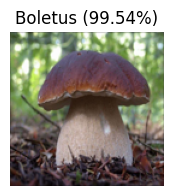

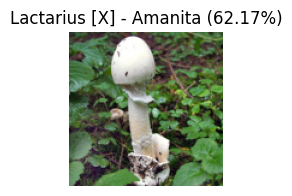

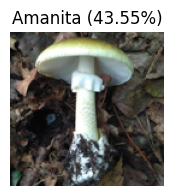

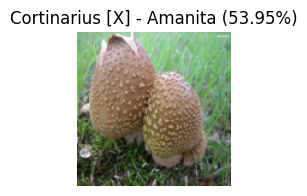

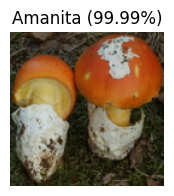

...

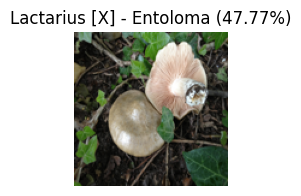

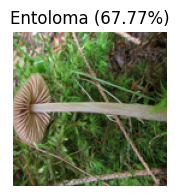

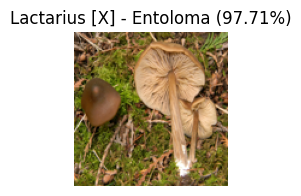

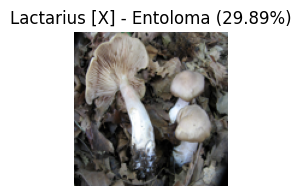

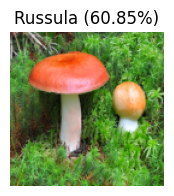

Prediction failed on image "MushroomsFromInternet/Russula/Russula-xerampelina_01.jpg": cannot reshape array of size 16384 into shape (1,128,128,3)


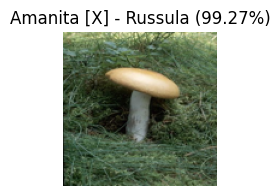

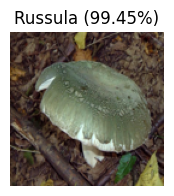

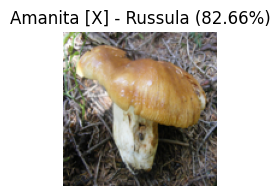

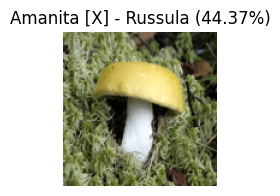

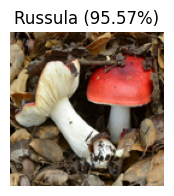

...

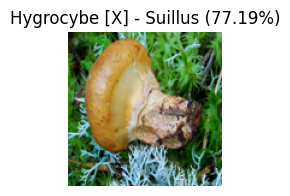

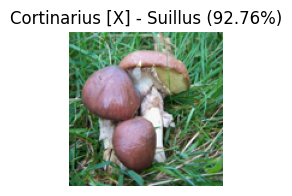

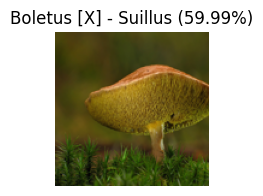

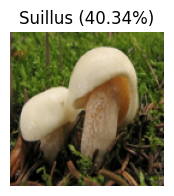

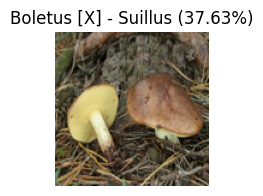

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:155: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:155: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

    Agaricus       1.00      0.40      0.57         5
     Amanita       0.23      0.50      0.32         6
     Boletus       0.46      0.86      0.60         7
 Cortinarius       0.33      0.29      0.31         7
    Entoloma       1.00      0.17      0.29         6
   Hygrocybe       0.00      0.00      0.00         6
   Lactarius       0.33      0.67      0.44         6
     Russula       0.62      0.62      0.62         8
     Suillus       0.67      0.22      0.33         9

    accuracy                           0.42        60
   macro avg       0.52      0.41      0.39        60
weighted avg       0.52      0.42      0.39        60



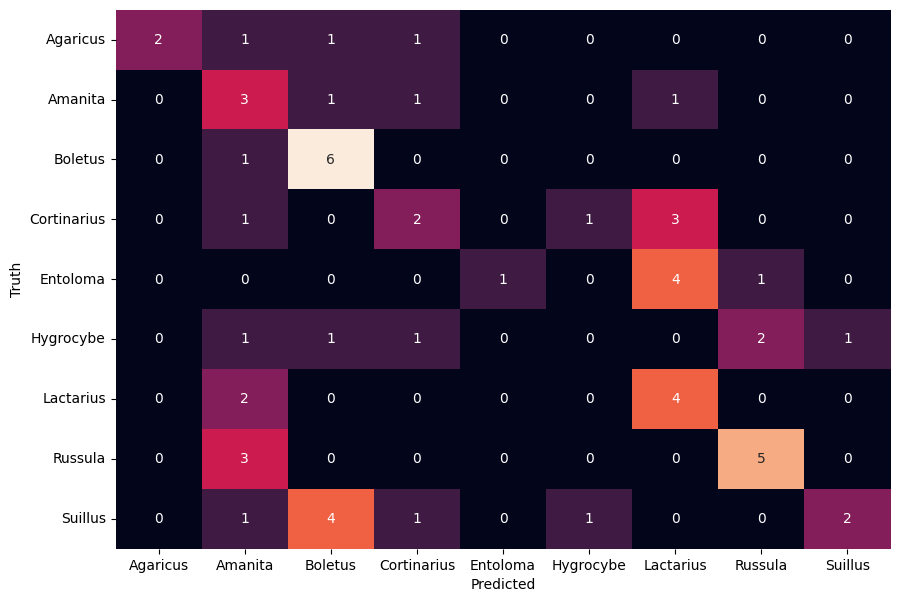

In [28]:
test_model_on_image(cnn, encoder, 'photo10.jpg', 128, 128, 3)

y_true, y_pred = test_model_on_dataset(cnn, encoder, 'MushroomsFromInternet', labels, 128, 128, 3)
print(classification_report(
    encoder.inverse_transform(y_true),
    encoder.inverse_transform(y_pred)))
show_confusion_matrix(y_true, y_pred, list(encoder.classes_))

## Model 2 (Transfer learning w/ VGG19)

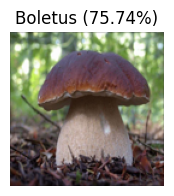

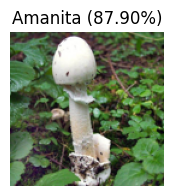

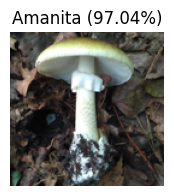

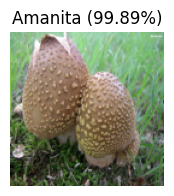

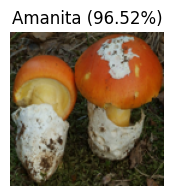

...

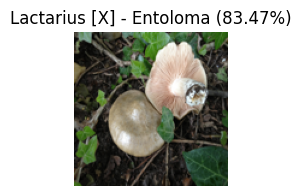

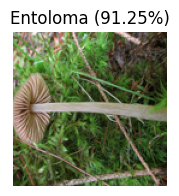

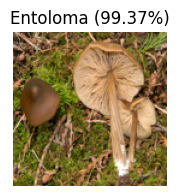

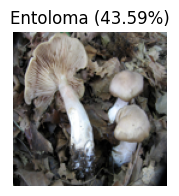

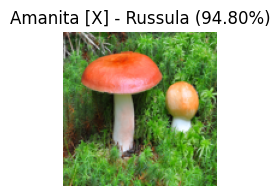

Prediction failed on image "MushroomsFromInternet/Russula/Russula-xerampelina_01.jpg": cannot reshape array of size 16384 into shape (1,128,128,3)


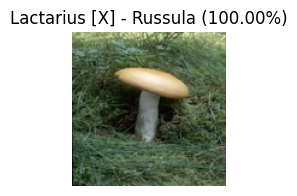

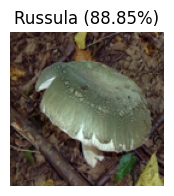

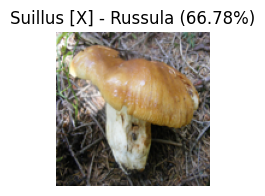

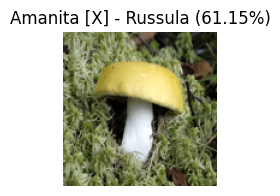

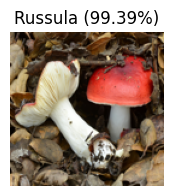

...

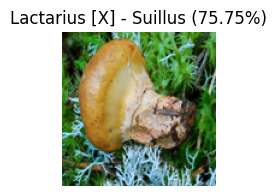

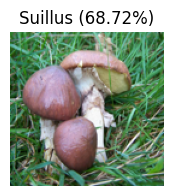

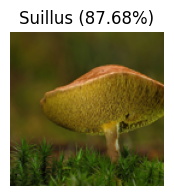

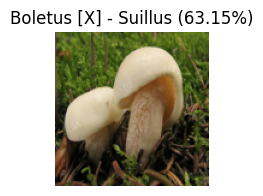

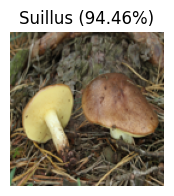

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:155: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:155: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

    Agaricus       1.00      0.80      0.89         5
     Amanita       0.50      1.00      0.67         6
     Boletus       0.67      0.86      0.75         7
 Cortinarius       0.67      0.29      0.40         7
    Entoloma       0.57      0.67      0.62         6
   Hygrocybe       1.00      0.50      0.67         6
   Lactarius       0.45      0.83      0.59         6
     Russula       1.00      0.50      0.67         8
     Suillus       0.71      0.56      0.63         9

    accuracy                           0.65        60
   macro avg       0.73      0.67      0.65        60
weighted avg       0.73      0.65      0.64        60



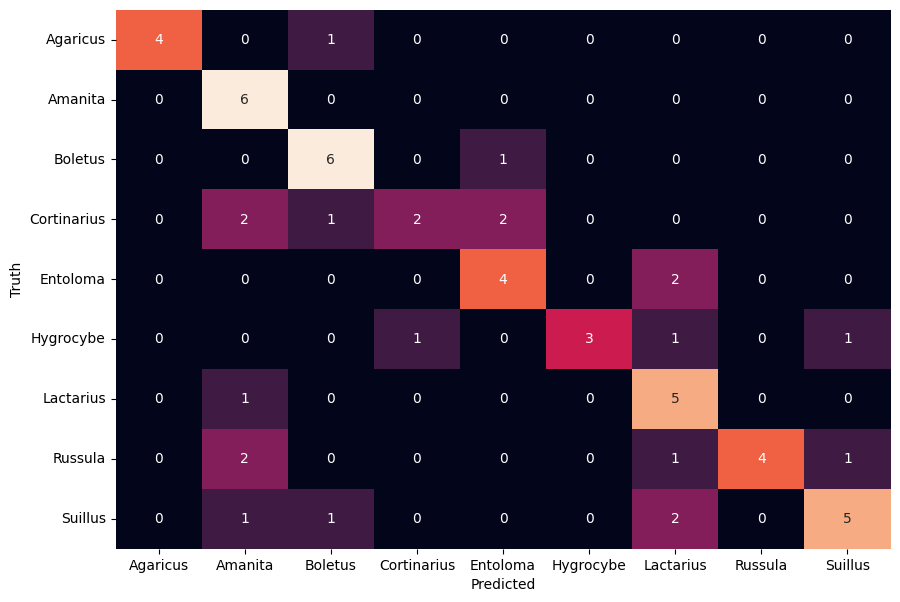

In [29]:
test_model_on_image(model_vgg19, encoder, 'photo10.jpg', 128, 128, 3)

y_true, y_pred = test_model_on_dataset(model_vgg19, encoder, 'MushroomsFromInternet', labels, 128, 128, 3)
print(classification_report(
    encoder.inverse_transform(y_true),
    encoder.inverse_transform(y_pred)))
show_confusion_matrix(y_true, y_pred, list(encoder.classes_))